In [2]:
#Parsing is the method of going through the file. Here we are give csv file
#Using Panda library for data manupulation and analysis
import pandas as pd
#Using Numpy library for mathematical calculations
import numpy as np
#Panda profile offers report generation for the dataset with lots of features 
#and customizations for the report generated. 
from pandas_profiling import ProfileReport
#Library for plotting graphs
import matplotlib.pyplot as plt
from scipy.stats import norm
import statistics


In the global spread of coronavirus/COVID-19, I have picked the Covid 19 data sets for this projects. Data played a significant role in Covid 19 situation. That's why to get better idea of numbers of deaths by covid 19 and the impact of vaccine, i picked CDC official website.
Resources:
Covid 19 cases and death rate by state(df_cases)= https://data.cdc.gov/Case-Surveillance/United-States-COVID-19-Cases-and-Deaths-by-State-o/9mfq-cb36
covid 19 vaccinations (df_vac) = https://covid.cdc.gov/covid-data-tracker/#vaccinations_vacc-people-onedose-pop-5yr

# Data Parsing

In [3]:
#Parsing file 'Covid 19 cases and deaths by state'
df_cases = pd.read_csv (r'United_States_COVID-19_Cases_and_Deaths_by_State_over_Time.csv')

In [4]:
df_cases.head(20)

,submission_date,state,tot_cases,conf_cases,prob_cases,new_case,pnew_case,tot_death,conf_death,prob_death,new_death,pnew_death,created_at,consent_cases,consent_deaths
0,01/14/2022,KS,621273,470516.0,150757.0,19414,6964.0,7162,NaN,NaN,21,4.0,01/15/2022 02:59:30 PM,Agree,NaN
1,01/02/2022,AS,11,NaN,NaN,0,0.0,0,NaN,NaN,0,0.0,01/03/2022 03:18:16 PM,NaN,NaN
2,01/30/2022,CO,1240361,1133083.0,107278.0,0,0.0,11061,9754.0,1307.0,0,0.0,01/31/2022 04:55:36 PM,Agree,Agree
3,07/09/2020,CO,36093,32964.0,3129.0,410,12.0,1706,1379.0,327.0,2,0.0,07/09/2020 12:00:00 AM,Agree,Agree
4,03/08/2022,FL,5821791,NaN,NaN,1629,477.0,72209,NaN,NaN,30,3.0,03/08/2022 12:00:00 AM,Not agree,Not agree
5,07/17/2020,MP,37,37.0,0.0,1,0.0,2,2.0,0.0,0,0.0,07/19/2020 12:00:00 AM,Agree,Agree
6,08/11/2020,FL,537222,NaN,NaN,7898,160.0,11175,NaN,NaN,187,2.0,08/11/2020 12:00:00 AM,Not agree,Not agree
7,01/01/2022,UT,636992,636992.0,0.0,0,0.0,3787,3635.0,152.0,0,0.0,01/03/2022 01:55:55 PM,Agree,Agree
8,05/22/2021,MA,704796,659246.0,45550.0,451,46.0,17818,17458.0,360.0,5,0.0,05/23/2021 01:37:59 PM,Agree,Agree
9,10/28/2020,PR,35112,34791.0,321.0,619,1.0,805,624.0,181.0,3,0.0,10/28/2020 12:00:00 AM,Agree,Agree


In [5]:
df_cases.describe()

,tot_cases,conf_cases,prob_cases,new_case,pnew_case,tot_death,conf_death,prob_death,new_death,pnew_death
count,4.704000e+04,2.574700e+04,25675.000000,47040.000000,43256.000000,47040.000000,25373.000000,25373.000000,47040.000000,43241.000000
mean,4.329360e+05,4.498751e+05,64103.691996,1678.816135,268.845316,7239.270068,7588.491704,828.554290,20.159184,2.071807
std,7.926135e+05,7.345848e+05,100651.982122,5368.845252,1582.969438,11833.928391,9599.460183,1240.634824,47.565142,27.739015
min,0.000000e+00,0.000000e+00,0.000000,-10199.000000,-171804.000000,0.000000,0.000000,0.000000,-352.000000,-2594.000000
25%,8.044000e+03,4.381100e+04,42.000000,28.000000,0.000000,164.000000,877.000000,0.000000,0.000000,0.000000
50%,1.329515e+05,1.993910e+05,12715.000000,391.000000,4.000000,2249.000000,3930.000000,232.000000,4.000000,0.000000
75%,5.378542e+05,6.143960e+05,95208.000000,1452.000000,176.000000,9117.250000,10733.000000,1133.000000,20.000000,1.000000
max,9.031767e+06,8.439055e+06,599278.000000,319809.000000,171617.000000,86794.000000,71408.000000,6556.000000,1178.000000,2919.000000


In [6]:
#shape function shows number of rows x columns
df_cases.shape

(47040, 15)

In [7]:
df_cases.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47040 entries, 0 to 47039
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   submission_date  47040 non-null  object 
 1   state            47040 non-null  object 
 2   tot_cases        47040 non-null  int64  
 3   conf_cases       25747 non-null  float64
 4   prob_cases       25675 non-null  float64
 5   new_case         47040 non-null  int64  
 6   pnew_case        43256 non-null  float64
 7   tot_death        47040 non-null  int64  
 8   conf_death       25373 non-null  float64
 9   prob_death       25373 non-null  float64
 10  new_death        47040 non-null  int64  
 11  pnew_death       43241 non-null  float64
 12  created_at       47040 non-null  object 
 13  consent_cases    39195 non-null  object 
 14  consent_deaths   39984 non-null  object 
dtypes: float64(6), int64(4), object(5)
memory usage: 5.4+ MB


In [8]:
#Parsing file 'covid 19 vaccinations'
#Note: The original file had some unnecessary comment in the beginning of the file . I had to remove that comment to form it into a proper dataframe
df_vac = pd.read_csv(r'covid19_vaccinations_in_the_united_states.csv')

In [9]:
df_vac.head(10)

,State/Territory/Federal Entity,Total Doses Delivered,Doses Delivered per 100K,18+ Doses Delivered per 100K,Total Doses Administered by State where Administered,Doses Administered per 100k by State where Administered,18+ Doses Administered by State where Administered,18+ Doses Administered per 100K by State where Administered,People with at least One Dose by State of Residence,Percent of Total Pop with at least One Dose by State of Residence,...,Percent People Primary Moderna Booster J&J,Percent People Primary Moderna Booster Other,Percent People Primary J&J Booster Pfizer,Percent People Primary J&J Booster Moderna,Percent People Primary J&J Booster J&J,Percent People Primary J&J Booster Other,Percent People Primary Other Booster Pfizer,Percent People Primary Other Booster Moderna,Percent People Primary Other Booster J&J,Percent People Primary Other Booster Uknown
0,United States,696302775,209724.0,269613.0,557407604,167889.0,504377501,195298.0,254681134,76.7,...,0.1,0.0,34.4,41.3,24.3,0.0,51.5,42.4,0.4,5.7
1,Alaska,1463365,200038.0,265313.0,1107985,151458.0,994000,180215.0,504533,69.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Alabama,9337440,190436.0,244764.0,6133930,125101.0,5727727,150142.0,3045185,62.1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Arkansas,5920080,196172.0,255435.0,4113617,136312.0,3753457,161951.0,1990630,66.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,American Samoa,110410,232972.0,352354.0,98196,207200.0,72731,232108.0,44140,93.1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,Arizona,14207420,195191.0,251972.0,11649977,160055.0,10506372,186333.0,5230429,71.9,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Bureau of Prisons,336130,NaN,NaN,308804,NaN,308802,NaN,143258,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,California,86656165,219315.0,283027.0,72163799,182637.0,64354747,210189.0,32482164,82.2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Colorado,11957275,207637.0,265763.0,10387568,180379.0,9361174,208062.0,4528524,78.6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,Connecticut,8372935,234846.0,295045.0,7346862,206066.0,6589962,232217.0,3362404,94.3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
# The info() function alone is not showing all the information so i am passing verbose and null count to print all the information and null values if any
df_vac.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64 entries, 0 to 63
Data columns (total 125 columns):
 #   Column                                                              Non-Null Count  Dtype  
---  ------                                                              --------------  -----  
 0   State/Territory/Federal Entity                                      64 non-null     object 
 1   Total Doses Delivered                                               64 non-null     int64  
 2   Doses Delivered per 100K                                            61 non-null     float64
 3   18+ Doses Delivered per 100K                                        60 non-null     float64
 4   Total Doses Administered by State where Administered                64 non-null     int64  
 5   Doses Administered per 100k by State where Administered             61 non-null     float64
 6   18+ Doses Administered by State where Administered                  64 non-null     int64  
 7   18+ Doses Administ

In [11]:
#shape function tell us number of rows x columns
df_vac.shape

(64, 125)

In [12]:
df_vac.describe()

,Total Doses Delivered,Doses Delivered per 100K,18+ Doses Delivered per 100K,Total Doses Administered by State where Administered,Doses Administered per 100k by State where Administered,18+ Doses Administered by State where Administered,18+ Doses Administered per 100K by State where Administered,People with at least One Dose by State of Residence,Percent of Total Pop with at least One Dose by State of Residence,People 18+ with at least One Dose by State of Residence,...,Percent People Primary Moderna Booster J&J,Percent People Primary Moderna Booster Other,Percent People Primary J&J Booster Pfizer,Percent People Primary J&J Booster Moderna,Percent People Primary J&J Booster J&J,Percent People Primary J&J Booster Other,Percent People Primary Other Booster Pfizer,Percent People Primary Other Booster Moderna,Percent People Primary Other Booster J&J,Percent People Primary Other Booster Uknown
count,6.400000e+01,61.000000,60.000000,6.400000e+01,61.000000,6.400000e+01,60.000000,6.400000e+01,61.000000,6.400000e+01,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
mean,2.202070e+07,203691.639344,266006.133333,1.765336e+07,164568.426230,1.598739e+07,193200.016667,8.078274e+06,75.186885,7.229437e+06,...,0.1,0.0,34.4,41.3,24.3,0.0,51.5,42.4,0.4,5.7
std,8.691571e+07,29781.880274,33022.387634,6.959926e+07,30957.438426,6.296088e+07,30281.583187,3.179626e+07,12.901156,2.841398e+07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,4.399000e+04,116386.000000,180181.000000,4.685800e+04,74418.000000,4.095400e+04,106236.000000,2.032100e+04,38.700000,1.742300e+04,...,0.1,0.0,34.4,41.3,24.3,0.0,51.5,42.4,0.4,5.7
25%,2.439482e+06,189419.000000,244975.500000,2.045417e+06,142407.000000,1.842924e+06,169252.250000,9.701808e+05,64.700000,8.674312e+05,...,0.1,0.0,34.4,41.3,24.3,0.0,51.5,42.4,0.4,5.7
50%,6.835270e+06,201090.000000,265538.000000,5.931608e+06,160055.000000,5.483254e+06,193308.000000,2.795677e+06,74.400000,2.554756e+06,...,0.1,0.0,34.4,41.3,24.3,0.0,51.5,42.4,0.4,5.7
75%,1.443971e+07,227840.000000,286204.750000,1.161356e+07,187211.000000,1.036591e+07,214128.500000,5.174034e+06,86.400000,4.552209e+06,...,0.1,0.0,34.4,41.3,24.3,0.0,51.5,42.4,0.4,5.7
max,6.963028e+08,274115.000000,352354.000000,5.574076e+08,219975.000000,5.043775e+08,254142.000000,2.546811e+08,95.000000,2.276572e+08,...,0.1,0.0,34.4,41.3,24.3,0.0,51.5,42.4,0.4,5.7


# Data Cleaning

In [13]:
#Check duplicate values in file 'Covid 19 cases and deaths by state'

duplicate = df_cases[df_cases.duplicated()]
duplicate.sum()
#There is no duplicate values

submission_date    0.0
state              0.0
tot_cases          0.0
conf_cases         0.0
prob_cases         0.0
new_case           0.0
pnew_case          0.0
tot_death          0.0
conf_death         0.0
prob_death         0.0
new_death          0.0
pnew_death         0.0
created_at         0.0
consent_cases      0.0
consent_deaths     0.0
dtype: float64

In [14]:
#change NaN values to zeros in file 'Covid 19 cases and deaths by state'.In object data type we can either keep it as it is or change to NA
#First find out the unique data types.
for col in df_cases:
  print(df_cases[col].unique())


['01/14/2022' '01/02/2022' '01/30/2022' '07/09/2020' '03/08/2022'
 '07/17/2020' '08/11/2020' '01/01/2022' '05/22/2021' '10/28/2020'
 '10/26/2021' '08/01/2021' '04/30/2021' '04/10/2020' '09/23/2021'
 '06/20/2021' '03/19/2020' '04/19/2021' '04/16/2020' '06/17/2021'
 '11/18/2021' '02/28/2022' '09/08/2021' '12/30/2021' '03/07/2021'
 '03/04/2020' '02/06/2022' '03/18/2020' '02/28/2020' '04/13/2021'
 '08/07/2021' '09/24/2021' '09/01/2020' '04/20/2020' '06/21/2021'
 '11/16/2020' '01/27/2020' '05/18/2021' '03/09/2021' '07/09/2021'
 '02/05/2021' '02/23/2021' '12/18/2021' '05/05/2020' '11/14/2021'
 '01/11/2022' '05/09/2021' '08/21/2021' '10/05/2021' '06/29/2021'
 '04/26/2020' '05/12/2021' '04/03/2020' '06/07/2021' '11/04/2021'
 '12/05/2021' '03/29/2021' '03/04/2022' '11/07/2020' '05/07/2020'
 '05/15/2021' '02/21/2020' '01/17/2021' '04/15/2020' '02/03/2022'
 '05/12/2020' '06/27/2020' '11/05/2021' '07/27/2021' '02/04/2021'
 '07/13/2021' '05/21/2020' '08/18/2021' '08/16/2020' '08/04/2020'
 '12/30/20

In [15]:
df_cases.fillna(0)

,submission_date,state,tot_cases,conf_cases,prob_cases,new_case,pnew_case,tot_death,conf_death,prob_death,new_death,pnew_death,created_at,consent_cases,consent_deaths
0,01/14/2022,KS,621273,470516.0,150757.0,19414,6964.0,7162,0.0,0.0,21,4.0,01/15/2022 02:59:30 PM,Agree,0
1,01/02/2022,AS,11,0.0,0.0,0,0.0,0,0.0,0.0,0,0.0,01/03/2022 03:18:16 PM,0,0
2,01/30/2022,CO,1240361,1133083.0,107278.0,0,0.0,11061,9754.0,1307.0,0,0.0,01/31/2022 04:55:36 PM,Agree,Agree
3,07/09/2020,CO,36093,32964.0,3129.0,410,12.0,1706,1379.0,327.0,2,0.0,07/09/2020 12:00:00 AM,Agree,Agree
4,03/08/2022,FL,5821791,0.0,0.0,1629,477.0,72209,0.0,0.0,30,3.0,03/08/2022 12:00:00 AM,Not agree,Not agree
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47035,06/07/2020,SD,5438,0.0,0.0,71,0.0,65,64.0,1.0,0,1.0,06/08/2020 02:55:08 PM,0,Agree
47036,04/30/2021,SD,122660,0.0,0.0,128,17.0,1967,1601.0,366.0,5,1.0,05/01/2021 01:43:22 PM,0,Agree
47037,04/06/2020,NM,686,0.0,0.0,62,0.0,12,0.0,0.0,0,0.0,04/08/2020 12:00:00 AM,0,Not agree
47038,04/02/2020,IA,614,0.0,0.0,65,0.0,11,0.0,0.0,2,0.0,04/01/2020 04:22:39 PM,Not agree,Not agree


In [16]:
#changes consent_cases NAN to N/A i.e. not available as shown in original data. 
#change consent_death too

df_cases['consent_cases'].replace(np.NaN,'N/A')
df_cases['consent_deaths'].replace(np.NaN,'N/A')

0              N/A
1              N/A
2            Agree
3            Agree
4        Not agree
           ...    
47035        Agree
47036        Agree
47037    Not agree
47038    Not agree
47039    Not agree
Name: consent_deaths, Length: 47040, dtype: object

In [17]:
#Change the column names to camel case
df_cases.columns=df_cases.columns.str.title()

In [18]:
df_cases.columns.tolist()

['Submission_Date',
 'State',
 'Tot_Cases',
 'Conf_Cases',
 'Prob_Cases',
 'New_Case',
 'Pnew_Case',
 'Tot_Death',
 'Conf_Death',
 'Prob_Death',
 'New_Death',
 'Pnew_Death',
 'Created_At',
 'Consent_Cases',
 'Consent_Deaths']

In [19]:
df_covid19 = df_cases.drop(["Prob_Cases","Pnew_Case","Prob_Death","Pnew_Death"],axis =1)

In [20]:
#Check duplicate values in file 'covid 19 vaccinations'
duplicate = df_vac[df_cases.duplicated()]
duplicate.sum()

<ipython-input-20-fdd9cb49b67c>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  duplicate = df_vac[df_cases.duplicated()]


State/Territory/Federal Entity                          0.0
Total Doses Delivered                                   0.0
Doses Delivered per 100K                                0.0
18+ Doses Delivered per 100K                            0.0
Total Doses Administered by State where Administered    0.0
                                                       ... 
Percent People Primary J&J Booster Other                0.0
Percent People Primary Other Booster Pfizer             0.0
Percent People Primary Other Booster Moderna            0.0
Percent People Primary Other Booster J&J                0.0
Percent People Primary Other Booster Uknown             0.0
Length: 125, dtype: float64

In [21]:
#change NaN values to zeros in file 'covid 19 vaccinations'.In object data type we can either keep it as it is or change to NA
#First find out the unique data types.
for col in df_vac:
  print(df_vac[col].unique())

['United States' 'Alaska' 'Alabama' 'Arkansas' 'American Samoa' 'Arizona'
 'Bureau of Prisons' 'California' 'Colorado' 'Connecticut'
 'District of Columbia' 'Dept of Defense' 'Delaware' 'Florida'
 'Federated States of Micronesia' 'Georgia' 'Guam' 'Hawaii' 'Iowa' 'Idaho'
 'Indian Health Svc' 'Illinois' 'Indiana' 'Kansas' 'Kentucky' 'Louisiana'
 'Massachusetts' 'Maryland' 'Maine' 'Marshall Islands' 'Michigan'
 'Minnesota' 'Missouri' 'Northern Mariana Islands' 'Mississippi' 'Montana'
 'North Carolina' 'North Dakota' 'Nebraska' 'New Hampshire' 'New Jersey'
 'New Mexico' 'Nevada' 'New York State' 'Ohio' 'Oklahoma' 'Oregon'
 'Pennsylvania' 'Puerto Rico' 'Republic of Palau' 'Rhode Island'
 'South Carolina' 'South Dakota' 'Tennessee' 'Texas' 'Utah' 'Virginia'
 'Veterans Health' 'Virgin Islands' 'Vermont' 'Washington' 'Wisconsin'
 'West Virginia' 'Wyoming']
[696302775   1463365   9337440   5920080    110410  14207420    336130
  86656165  11957275   8372935   1794605   6637410   2242855  460393

In [22]:
df_vac=df_vac.fillna(0)

In [23]:
#Change the column names to camel case
df_vac.columns=df_vac.columns.str.title()
df_vac

,State/Territory/Federal Entity,Total Doses Delivered,Doses Delivered Per 100K,18+ Doses Delivered Per 100K,Total Doses Administered By State Where Administered,Doses Administered Per 100K By State Where Administered,18+ Doses Administered By State Where Administered,18+ Doses Administered Per 100K By State Where Administered,People With At Least One Dose By State Of Residence,Percent Of Total Pop With At Least One Dose By State Of Residence,...,Percent People Primary Moderna Booster J&J,Percent People Primary Moderna Booster Other,Percent People Primary J&J Booster Pfizer,Percent People Primary J&J Booster Moderna,Percent People Primary J&J Booster J&J,Percent People Primary J&J Booster Other,Percent People Primary Other Booster Pfizer,Percent People Primary Other Booster Moderna,Percent People Primary Other Booster J&J,Percent People Primary Other Booster Uknown
0,United States,696302775,209724.0,269613.0,557407604,167889.0,504377501,195298.0,254681134,76.7,...,0.1,0.0,34.4,41.3,24.3,0.0,51.5,42.4,0.4,5.7
1,Alaska,1463365,200038.0,265313.0,1107985,151458.0,994000,180215.0,504533,69.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Alabama,9337440,190436.0,244764.0,6133930,125101.0,5727727,150142.0,3045185,62.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Arkansas,5920080,196172.0,255435.0,4113617,136312.0,3753457,161951.0,1990630,66.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,American Samoa,110410,232972.0,352354.0,98196,207200.0,72731,232108.0,44140,93.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,Vermont,1710450,274115.0,335393.0,1354887,217133.0,1214867,238217.0,578445,92.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
60,Washington,17000595,223255.0,285636.0,13954436,183252.0,12577923,211329.0,6095185,80.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
61,Wisconsin,11164945,191757.0,245069.0,9930361,170553.0,9053509,198723.0,4149844,71.3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
62,West Virginia,3891845,217161.0,271667.0,2649152,147820.0,2477825,172962.0,1154289,64.4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [24]:
#check if have any missing data
df_vac.isnull()

,State/Territory/Federal Entity,Total Doses Delivered,Doses Delivered Per 100K,18+ Doses Delivered Per 100K,Total Doses Administered By State Where Administered,Doses Administered Per 100K By State Where Administered,18+ Doses Administered By State Where Administered,18+ Doses Administered Per 100K By State Where Administered,People With At Least One Dose By State Of Residence,Percent Of Total Pop With At Least One Dose By State Of Residence,...,Percent People Primary Moderna Booster J&J,Percent People Primary Moderna Booster Other,Percent People Primary J&J Booster Pfizer,Percent People Primary J&J Booster Moderna,Percent People Primary J&J Booster J&J,Percent People Primary J&J Booster Other,Percent People Primary Other Booster Pfizer,Percent People Primary Other Booster Moderna,Percent People Primary Other Booster J&J,Percent People Primary Other Booster Uknown
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
60,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
61,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
62,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [25]:
#checking if there is any spelling mistakes as there are 125 number of columns
df_vac.columns.tolist()

['State/Territory/Federal Entity',
 'Total Doses Delivered',
 'Doses Delivered Per 100K',
 '18+ Doses Delivered Per 100K',
 'Total Doses Administered By State Where Administered',
 'Doses Administered Per 100K By State Where Administered',
 '18+ Doses Administered By State Where Administered',
 '18+ Doses Administered Per 100K By State Where Administered',
 'People With At Least One Dose By State Of Residence',
 'Percent Of Total Pop With At Least One Dose By State Of Residence',
 'People 18+ With At Least One Dose By State Of Residence',
 'Percent Of 18+ Pop With At Least One Dose By State Of Residence',
 'People Fully Vaccinated By State Of Residence',
 'Percent Of Total Pop Fully Vaccinated By State Of Residence',
 'People 18+ Fully Vaccinated By State Of Residence',
 'Percent Of 18+ Pop Fully Vaccinated By State Of Residence',
 'Total Number Of Pfizer Doses Delivered',
 'Total Number Of Moderna Doses Delivered',
 'Total Number Of Janssen Doses Delivered',
 'Total Number Of Doses Fr

In [26]:
#changing states to Abbreviation 
us_state_to_abbrev = {
    "Alabama": "AL",
    "Alaska": "AK",
    "Arizona": "AZ",
    "Arkansas": "AR",
    "California": "CA",
    "Colorado": "CO",
    "Connecticut": "CT",
    "Delaware": "DE",
    "Florida": "FL",
    "Georgia": "GA",
    "Hawaii": "HI",
    "Idaho": "ID",
    "Illinois": "IL",
    "Indiana": "IN",
    "Iowa": "IA",
    "Kansas": "KS",
    "Kentucky": "KY",
    "Louisiana": "LA",
    "Maine": "ME",
    "Maryland": "MD",
    "Massachusetts": "MA",
    "Michigan": "MI",
    "Minnesota": "MN",
    "Mississippi": "MS",
    "Missouri": "MO",
    "Montana": "MT",
    "Nebraska": "NE",
    "Nevada": "NV",
    "New Hampshire": "NH",
    "New Jersey": "NJ",
    "New Mexico": "NM",
    "New York": "NY",
    "North Carolina": "NC",
    "North Dakota": "ND",
    "Ohio": "OH",
    "Oklahoma": "OK",
    "Oregon": "OR",
    "Pennsylvania": "PA",
    "Rhode Island": "RI",
    "South Carolina": "SC",
    "South Dakota": "SD",
    "Tennessee": "TN",
    "Texas": "TX",
    "Utah": "UT",
    "Vermont": "VT",
    "Virginia": "VA",
    "Washington": "WA",
    "West Virginia": "WV",
    "Wisconsin": "WI",
    "Wyoming": "WY",
    "District of Columbia": "DC",
    "American Samoa": "AS",
    "Guam": "GU",
    "Northern Mariana Islands": "MP",
    "Puerto Rico": "PR",
    "United States Minor Outlying Islands": "UM",
    "U.S. Virgin Islands": "VI",
}
# abbrev_to_us_state = dict(map(reversed, us_state_to_abbrev.items()))
keys = us_state_to_abbrev.keys()
values =us_state_to_abbrev.values()

In [27]:
df_vac['State']=df_vac['State/Territory/Federal Entity'].replace(to_replace = keys, value = values)

In [28]:
# Create a New DataFrame because there are so many columns and it will take longer to delete more columns than keep
df_vacci= df_vac[['State', 'People With Moderna Booster Dose',
 'People With Pfizer Booster Dose',
 'People With Janssen Booster Dose',
 'People With Booster Dose Of An Other Manufacturer','People 18+ Fully Vaccinated Moderna Resident',
 'People 18+ Fully Vaccinated Pfizer Resident',
 'People 18+ Fully Vaccinated Janssen Resident',
 'People 18+ Fully Vaccinated Other 2-Dose Manufacturer Resident',
 'Percent Of Fully Vaccinated People With Booster Doses',
 'People 12+ Who Have Received A Booster Dose',
 'Percent Of Fully Vaccinated People 12+ With Booster Doses',
 'People 18+ Who Have Received A Booster Dose',
 'Percent Of Fully Vaccinated People 18+ With Booster Doses',
 'People 65+ Who Have Received A Booster Dose',
 'Percent Of Fully Vaccinated People 65+ With Booster Doses']].copy()
df_vacci

,State,People With Moderna Booster Dose,People With Pfizer Booster Dose,People With Janssen Booster Dose,People With Booster Dose Of An Other Manufacturer,People 18+ Fully Vaccinated Moderna Resident,People 18+ Fully Vaccinated Pfizer Resident,People 18+ Fully Vaccinated Janssen Resident,People 18+ Fully Vaccinated Other 2-Dose Manufacturer Resident,Percent Of Fully Vaccinated People With Booster Doses,People 12+ Who Have Received A Booster Dose,Percent Of Fully Vaccinated People 12+ With Booster Doses,People 18+ Who Have Received A Booster Dose,Percent Of Fully Vaccinated People 18+ With Booster Doses,People 65+ Who Have Received A Booster Dose,Percent Of Fully Vaccinated People 65+ With Booster Doses
0,United States,41513786,53149023,1451123,25692,75508691,101882112,16781570,139385,44.4,96120144,46.0,92822134,47.8,32545208,66.8
1,AK,83597,101656,2846,23,159265,199706,41195,109,41.9,188048,43.5,180952,45.2,56034,71.6
2,AL,422891,418950,15357,94,1020705,1121912,164243,664,34.6,857188,35.2,843513,36.6,394803,57.2
3,AR,303401,306813,9796,453,658515,700004,111568,870,38.2,620335,39.3,605526,41.2,261821,62.8
4,AS,3992,11157,0,0,9217,18184,574,241,38.3,15141,44.2,13712,48.6,1757,62.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,VT,126947,164800,4446,16,176848,219316,47133,249,59.0,296150,62.1,280781,63.3,99265,78.9
60,WA,1204259,1529305,36606,862,1885289,2536899,449283,3827,50.7,2769919,52.8,2656664,54.5,848289,75.2
61,WI,867859,1181582,26830,105,1326236,1772972,298820,780,55.0,2076065,57.1,2012483,59.2,770039,79.9
62,WV,215480,235167,4946,74,418537,468251,60442,430,44.6,455584,45.5,446320,47.1,201531,65.6


In [29]:
# df_vacci=df_vacci.drop(['State/Territory/Federal Entity'], axis = 1)

In [30]:
# first_column = df_vacci.pop('State')
  
# # insert column using insert(position,column_name,first_column) function
# df_vacci.insert(0, 'State', first_column)


In [31]:
#Find the first 10 states with highest deaths rate using Convi19 dataset
# index corresponding max value

df_covid19.groupby(['State']).sum().nlargest(10, ['Tot_Death'])

# i am picking first 10 states with highest death rate so we can further dig into the data

,Tot_Cases,Conf_Cases,New_Case,Tot_Death,Conf_Death,New_Death
State,,,,,,
CA,2239410479,2.164988e+09,8854517,31217784,20529490.0,86792
TX,1797809645,0.000000e+00,6442161,29189927,0.0,85123
FL,1515968989,0.000000e+00,5829817,23928958,0.0,72246
NYC,573162355,4.856721e+08,2290200,20698788,17243297.0,39996
NJ,583155173,4.552831e+08,2191562,15561943,14004322.0,31302
PA,697439487,5.877677e+08,2753823,15036048,0.0,43909
IL,818660523,8.180061e+08,3049616,14093865,12817839.0,37392
GA,694977862,5.553388e+08,2478986,11947331,10388311.0,35828
MI,597836696,5.324043e+08,2374382,11857731,11119509.0,29801


In [32]:
# df_cases.loc[df_cases['State'] == 'CA']
df_covid19=df_covid19.loc[df_covid19['State'].isin(['CA','TX','FL','NYC','NJ','PA','IL','GA','MI','NY'])].groupby(['State']).sum()


In [33]:
#Accordingly fetch the Vaccination data for states with highest number of deaths
df_vacci=df_vacci.loc[df_vacci['State'].isin(['CA','TX','FL','NYC','NJ','PA','IL','GA','MI','NY'])].groupby(['State']).sum()


In [34]:
df_covid19

,Tot_Cases,Conf_Cases,New_Case,Tot_Death,Conf_Death,New_Death
State,,,,,,
CA,2239410479,2.164988e+09,8854517,31217784,20529490.0,86792
FL,1515968989,0.000000e+00,5829817,23928958,0.0,72246
GA,694977862,5.553388e+08,2478986,11947331,10388311.0,35828
IL,818660523,8.180061e+08,3049616,14093865,12817839.0,37392
MI,597836696,5.324043e+08,2374382,11857731,11119509.0,29801
NJ,583155173,4.552831e+08,2191562,15561943,14004322.0,31302
NY,676856262,0.000000e+00,2646449,11392307,0.0,27463
NYC,573162355,4.856721e+08,2290200,20698788,17243297.0,39996
PA,697439487,5.877677e+08,2753823,15036048,0.0,43909


In [35]:
#Assign back the indexes of the datasets
df_covid19 = df_covid19.reset_index()
df_covid19
df_vacci = df_vacci.reset_index()


In [36]:
#set_option() changes behavior globaly in Jupyter Notebooks, so it is not a temporary fix.
pd.set_option('display.float_format', lambda x: '%.5f' % x)

# Data Analysis

  A data analysis script (data_analysis.py) that’s shows how you calculated three different analytical techniques such as correlation coefficients, averages, and/or counts of data (if you did your data analysis in Jupyter Notebooks you don't need a separate script, just make sure you label it clearly in your notebook and provide textual clarification for why you used the analytical techniques that you did)

In [37]:
#Profile of 'Covid 19 cases and deaths by state'
profile_cases = ProfileReport(df_covid19)
profile_cases

In [38]:
#Profile of 'Covid 19 vaccinations'
profile_vac = ProfileReport(df_vacci)
profile_vac


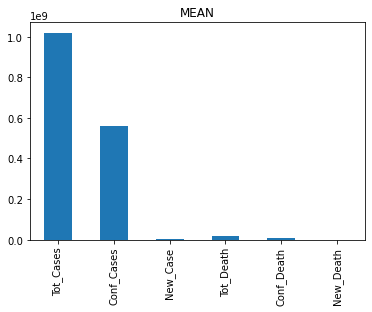

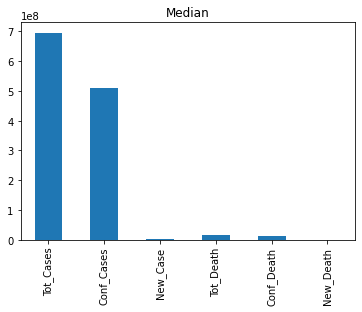

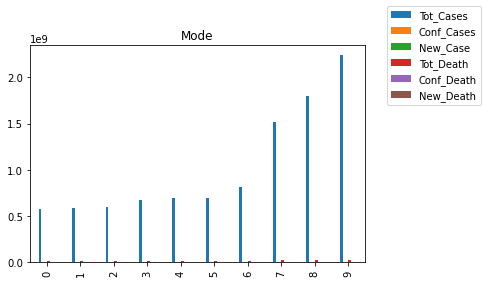

In [39]:
df_covid19.mean().plot(kind='bar')
plt.title("MEAN")
plt.show()
df_covid19.median().plot(kind='bar')
plt.title("Median")
df_covid19.mode().plot(kind='bar')
plt.title("Mode")
plt.legend(bbox_to_anchor=(1.05, 1.0, 0.3, 0.2), loc='upper left')
plt.show()

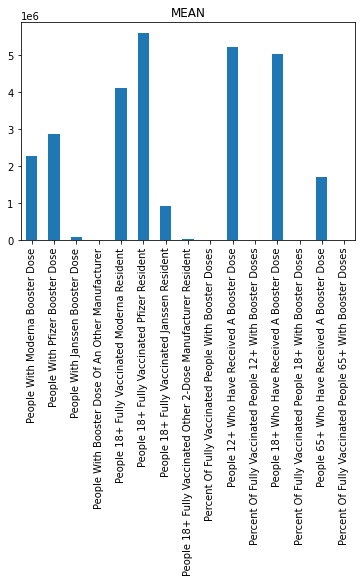

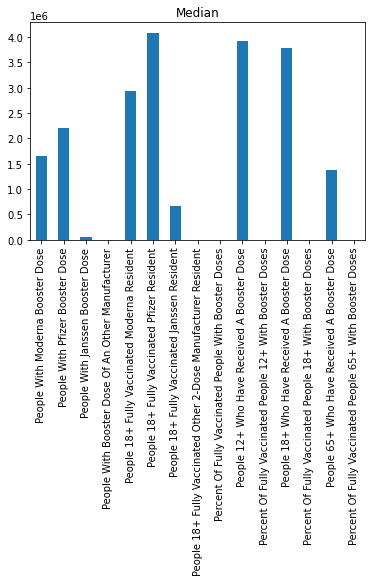

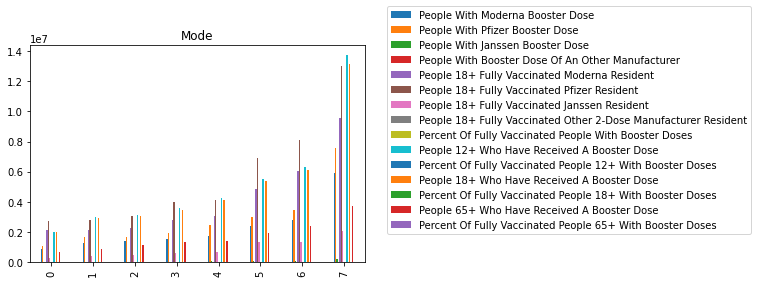

In [40]:
df_vacci.mean().plot(kind='bar')
plt.title("MEAN")
plt.show()
df_vacci.median().plot(kind='bar')
plt.title("Median")
df_vacci.mode().plot(kind='bar')
plt.title("Mode")
plt.legend(bbox_to_anchor=(1.05, 1.0, 0.3, 0.2), loc='upper left')
plt.show()

In [41]:
#Display both datasets side by side
display(df_covid19)
display(df_vacci)

,State,Tot_Cases,Conf_Cases,New_Case,Tot_Death,Conf_Death,New_Death
0,CA,2239410479,2164988293.00000,8854517,31217784,20529490.00000,86792
1,FL,1515968989,0.00000,5829817,23928958,0.00000,72246
2,GA,694977862,555338807.00000,2478986,11947331,10388311.00000,35828
3,IL,818660523,818006130.00000,3049616,14093865,12817839.00000,37392
4,MI,597836696,532404279.00000,2374382,11857731,11119509.00000,29801
5,NJ,583155173,455283112.00000,2191562,15561943,14004322.00000,31302
6,NY,676856262,0.00000,2646449,11392307,0.00000,27463
7,NYC,573162355,485672087.00000,2290200,20698788,17243297.00000,39996
8,PA,697439487,587767723.00000,2753823,15036048,0.00000,43909
9,TX,1797809645,0.00000,6442161,29189927,0.00000,85123


,State,People With Moderna Booster Dose,People With Pfizer Booster Dose,People With Janssen Booster Dose,People With Booster Dose Of An Other Manufacturer,People 18+ Fully Vaccinated Moderna Resident,People 18+ Fully Vaccinated Pfizer Resident,People 18+ Fully Vaccinated Janssen Resident,People 18+ Fully Vaccinated Other 2-Dose Manufacturer Resident,Percent Of Fully Vaccinated People With Booster Doses,People 12+ Who Have Received A Booster Dose,Percent Of Fully Vaccinated People 12+ With Booster Doses,People 18+ Who Have Received A Booster Dose,Percent Of Fully Vaccinated People 18+ With Booster Doses,People 65+ Who Have Received A Booster Dose,Percent Of Fully Vaccinated People 65+ With Booster Doses
0,CA,5932032,7561425,216554,537,9581653,12994228,2068530,4544,49.00000,13708691,51.10000,13145354,53.30000,3703706,71.30000
1,FL,2379081,3035124,101474,6428,4833028,6910849,1346149,37820,38.80000,5521346,39.70000,5411005,41.20000,2442507,60.20000
2,GA,909096,1108239,24128,1512,2122244,2773536,316073,10326,35.60000,2042393,36.50000,1990282,38.10000,689452,55.10000
3,IL,1744845,2471339,52038,1560,2784431,4160462,619151,8863,49.60000,4269085,52.10000,4103885,54.20000,1358535,75.90000
4,MI,1410964,1701210,46952,123,2156590,2818111,418020,1004,53.10000,3158892,55.00000,3066175,56.80000,1163011,75.50000
5,NJ,1298637,1677926,63619,61,2286200,3091911,511344,1188,45.90000,3039660,47.70000,2919617,49.60000,895695,66.60000
6,PA,1568785,1948637,59237,60,3082577,4007381,717460,606,41.50000,3576088,43.00000,3462875,44.40000,1389430,62.80000
7,TX,2782681,3468184,96875,209,6040777,8092671,1342964,870,36.20000,6347503,37.60000,6135065,39.60000,1962400,61.00000


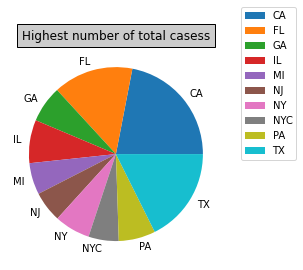

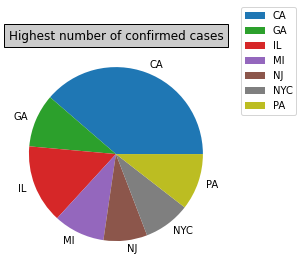

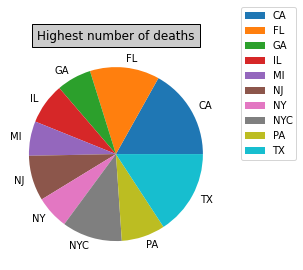

In [42]:
#Piechart using Covid 19 cases dataset
df_covid19.groupby(['State']).sum().plot(kind='pie', y='Tot_Cases')
plt.title("Highest number of total casess", bbox={'facecolor':'0.8', 'pad':5})
plt.legend(bbox_to_anchor=(1.05, 1.0, 0.3, 0.2), loc='upper left')
plt. ylabel("") 
df_covid19.groupby(['State']).sum().plot(kind='pie', y='Conf_Cases')
plt. ylabel("") 
plt.title("Highest number of confirmed cases", bbox={'facecolor':'0.8', 'pad':5})
plt.legend(bbox_to_anchor=(1.05, 1.0, 0.3, 0.2), loc='upper left')
df_covid19.groupby(['State']).sum().plot(kind='pie', y='Tot_Death')
plt.title("Highest number of deaths", bbox={'facecolor':'0.8', 'pad':5})
plt. ylabel("") 
plt.legend(bbox_to_anchor=(1.05, 1.0, 0.3, 0.2), loc='upper left')

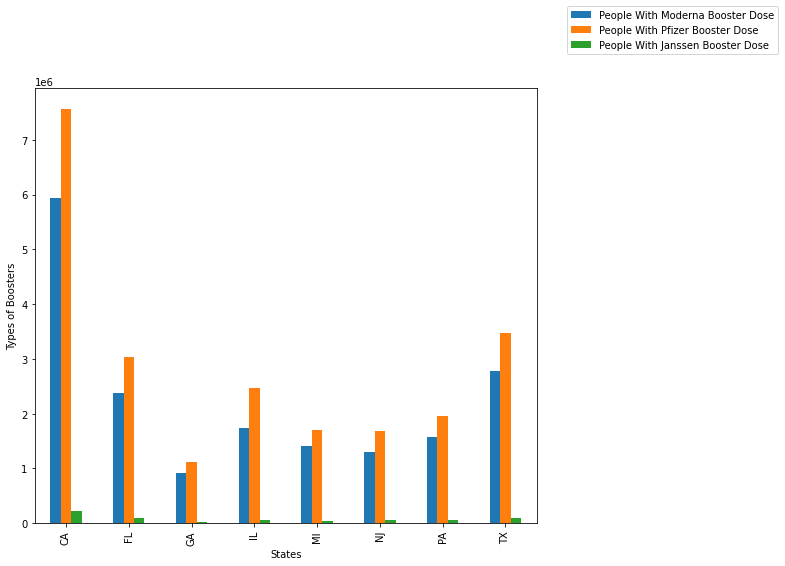

In [43]:
#We will see which vaccine is mostly used in states


df_vacci.plot(x="State", y=["People With Moderna Booster Dose", "People With Pfizer Booster Dose","People With Janssen Booster Dose"], kind="bar",figsize=(9,8))
plt. legend() 
plt.legend( loc='best')
plt.xlabel('States')
plt.ylabel('Types of Boosters')
plt.legend(bbox_to_anchor=(1.05, 1.0, 0.3, 0.2), loc='upper left')



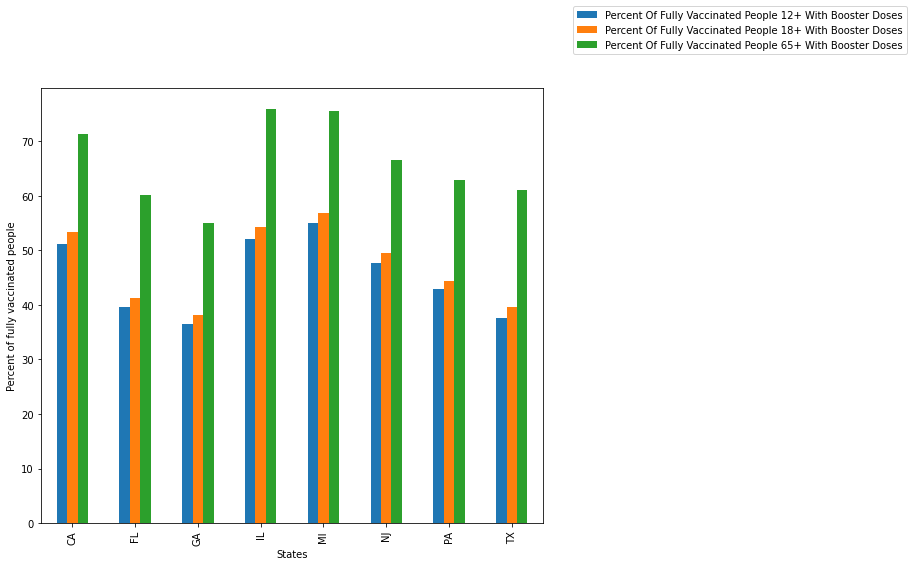

In [44]:
#We will see percentage of people fully vaccinated in different states for different age groups 

df_vacci.plot(x="State", y=["Percent Of Fully Vaccinated People 12+ With Booster Doses", "Percent Of Fully Vaccinated People 18+ With Booster Doses","Percent Of Fully Vaccinated People 65+ With Booster Doses"], kind="bar",figsize=(9,8))
plt. legend() 
plt.legend( loc='best')
plt.xlabel('States')
plt.ylabel('Percent of fully vaccinated people')
plt.legend(bbox_to_anchor=(1.05, 1.0, 0.3, 0.2), loc='upper left')


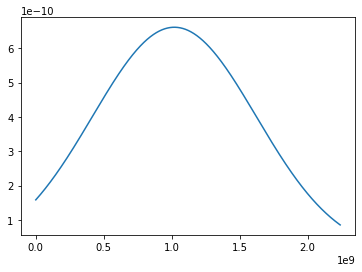

In [45]:
#Normal Distribution 2
#Normal Distribution is a probability function used in statistics that tells about how the data values are distributed.
#statistic library to find standard distribution of Total Cases
x = np.arange(200000, 2239410479, 1000 )
mean = statistics.mean(df_covid19['Tot_Cases'])
sd = statistics.stdev(df_covid19['Tot_Cases'])


# plt.plot(x, norm.pdf(df_covid19['Tot_Cases'], 0, 1))


# x_axis = np.arange(-20, 20, 0.01)
  
# # Calculating mean and standard deviation
# mean = statistics.mean(x_axis)
# sd = statistics.stdev(x_axis)
  
plt.plot(x, norm.pdf(x, mean, sd))
plt.show()

In [46]:
#Mortality rate of Covid cases 
df_covid19["Mortality Rate"]=round((df_covid19["Tot_Death"]/df_covid19["Conf_Death"])*100,1)


In [47]:
#Changing inf morality rate to -1 indicating that this is not zero but infinite
df_covid19=df_covid19.replace(to_replace =np.inf,value =-1)
df_covid19

,State,Tot_Cases,Conf_Cases,New_Case,Tot_Death,Conf_Death,New_Death,Mortality Rate
0,CA,2239410479,2164988293.00000,8854517,31217784,20529490.00000,86792,152.10000
1,FL,1515968989,0.00000,5829817,23928958,0.00000,72246,-1.00000
2,GA,694977862,555338807.00000,2478986,11947331,10388311.00000,35828,115.00000
3,IL,818660523,818006130.00000,3049616,14093865,12817839.00000,37392,110.00000
4,MI,597836696,532404279.00000,2374382,11857731,11119509.00000,29801,106.60000
5,NJ,583155173,455283112.00000,2191562,15561943,14004322.00000,31302,111.10000
6,NY,676856262,0.00000,2646449,11392307,0.00000,27463,-1.00000
7,NYC,573162355,485672087.00000,2290200,20698788,17243297.00000,39996,120.00000
8,PA,697439487,587767723.00000,2753823,15036048,0.00000,43909,-1.00000
9,TX,1797809645,0.00000,6442161,29189927,0.00000,85123,-1.00000


In [48]:
#Compute pairwise correlation of columns, excluding NA/null values.
#Showing correlation between the dataset of df_covid19
df_covid19.corr(method ='pearson')


,Tot_Cases,Conf_Cases,New_Case,Tot_Death,Conf_Death,New_Death,Mortality Rate
Tot_Cases,1.00000,0.42724,0.99646,0.90546,0.01391,0.96344,-0.06252
Conf_Cases,0.42724,1.00000,0.47405,0.34567,0.73222,0.29896,0.69430
New_Case,0.99646,0.47405,1.00000,0.90126,0.04929,0.95165,-0.03397
Tot_Death,0.90546,0.34567,0.90126,1.00000,0.11402,0.95117,-0.01781
Conf_Death,0.01391,0.73222,0.04929,0.11402,1.00000,-0.07540,0.97504
New_Death,0.96344,0.29896,0.95165,0.95117,-0.07540,1.00000,-0.16355
Mortality Rate,-0.06252,0.69430,-0.03397,-0.01781,0.97504,-0.16355,1.00000


In [49]:
#Correlation 3
#Showing correlation between the dataset of df_vacci
df_vacci.corr(method='pearson')

,People With Moderna Booster Dose,People With Pfizer Booster Dose,People With Janssen Booster Dose,People With Booster Dose Of An Other Manufacturer,People 18+ Fully Vaccinated Moderna Resident,People 18+ Fully Vaccinated Pfizer Resident,People 18+ Fully Vaccinated Janssen Resident,People 18+ Fully Vaccinated Other 2-Dose Manufacturer Resident,Percent Of Fully Vaccinated People With Booster Doses,People 12+ Who Have Received A Booster Dose,Percent Of Fully Vaccinated People 12+ With Booster Doses,People 18+ Who Have Received A Booster Dose,Percent Of Fully Vaccinated People 18+ With Booster Doses,People 65+ Who Have Received A Booster Dose,Percent Of Fully Vaccinated People 65+ With Booster Doses
People With Moderna Booster Dose,1.00000,0.99859,0.98512,-0.00551,0.97509,0.97467,0.93966,0.00818,0.19233,0.99958,0.20129,0.99959,0.21956,0.95534,0.22696
People With Pfizer Booster Dose,0.99859,1.00000,0.98221,0.00428,0.96919,0.97129,0.93550,0.01727,0.20996,0.99970,0.22018,0.99957,0.23890,0.95400,0.25085
People With Janssen Booster Dose,0.98512,0.98221,1.00000,0.05875,0.96526,0.96618,0.95274,0.07351,0.17257,0.98438,0.17841,0.98504,0.19464,0.96276,0.18500
People With Booster Dose Of An Other Manufacturer,-0.00551,0.00428,0.05875,1.00000,0.06292,0.10642,0.21622,0.99849,-0.32212,0.00151,-0.33889,0.01008,-0.34682,0.24848,-0.31362
People 18+ Fully Vaccinated Moderna Resident,0.97509,0.96919,0.96526,0.06292,1.00000,0.99816,0.97950,0.07278,-0.00706,0.97230,0.00258,0.97371,0.02195,0.95649,0.05257
People 18+ Fully Vaccinated Pfizer Resident,0.97467,0.97129,0.96618,0.10642,0.99816,1.00000,0.98508,0.11532,0.00186,0.97332,0.01179,0.97494,0.03130,0.96573,0.06760
People 18+ Fully Vaccinated Janssen Resident,0.93966,0.93550,0.95274,0.21622,0.97950,0.98508,1.00000,0.22109,-0.04353,0.93827,-0.03622,0.94125,-0.01970,0.97643,0.02285
People 18+ Fully Vaccinated Other 2-Dose Manufacturer Resident,0.00818,0.01727,0.07351,0.99849,0.07278,0.11532,0.22109,1.00000,-0.32451,0.01483,-0.34211,0.02327,-0.35006,0.25604,-0.32775
Percent Of Fully Vaccinated People With Booster Doses,0.19233,0.20996,0.17257,-0.32212,-0.00706,0.00186,-0.04353,-0.32451,1.00000,0.20166,0.99910,0.19683,0.99754,0.11053,0.96063
People 12+ Who Have Received A Booster Dose,0.99958,0.99970,0.98438,0.00151,0.97230,0.97332,0.93827,0.01483,0.20166,1.00000,0.21126,0.99995,0.22975,0.95544,0.23942


In [50]:
#Compute Correlation between New Death and Fully vaccinated people with booster
df_covid19['New_Death'].corr(df_vacci['Percent Of Fully Vaccinated People With Booster Doses'])
#Shows a weak correlation between Deaths and vaccinated data

0.02011794152150614

In [51]:
#As the data set vaccination doesnot have NYC and NJ states
#so we will create another temp covid df to plot the correlation between two datasets

df_new_covid= df_covid19.drop([6,7],axis=0)
df_new_covid

,State,Tot_Cases,Conf_Cases,New_Case,Tot_Death,Conf_Death,New_Death,Mortality Rate
0,CA,2239410479,2164988293.00000,8854517,31217784,20529490.00000,86792,152.10000
1,FL,1515968989,0.00000,5829817,23928958,0.00000,72246,-1.00000
2,GA,694977862,555338807.00000,2478986,11947331,10388311.00000,35828,115.00000
3,IL,818660523,818006130.00000,3049616,14093865,12817839.00000,37392,110.00000
4,MI,597836696,532404279.00000,2374382,11857731,11119509.00000,29801,106.60000
5,NJ,583155173,455283112.00000,2191562,15561943,14004322.00000,31302,111.10000
8,PA,697439487,587767723.00000,2753823,15036048,0.00000,43909,-1.00000
9,TX,1797809645,0.00000,6442161,29189927,0.00000,85123,-1.00000


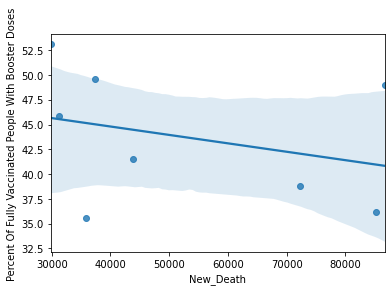

In [52]:
import seaborn as sns

sns.regplot(x=df_new_covid['New_Death'], y=df_vacci['Percent Of Fully Vaccinated People With Booster Doses'])
plt.show()

<AxesSubplot:xlabel='New_Case', ylabel='Percent Of Fully Vaccinated People With Booster Doses'>

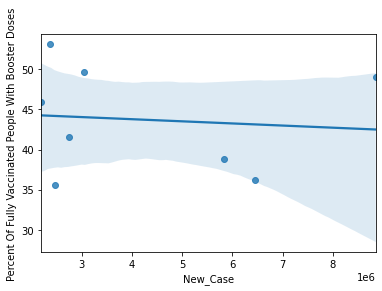

In [53]:
sns.regplot(x=df_new_covid['New_Case'], y=df_vacci['Percent Of Fully Vaccinated People With Booster Doses'])
